In [1]:
import glob, pylab, pandas as pd
import pydicom, numpy as np
from os import listdir
from os.path import isfile, join
import matplotlib.pylab as plt
import matplotlib.pyplot as plt2
from plotly.offline import init_notebook_mode
import plotly.graph_objs as go
from plotly import tools
import os
import seaborn as sns
from keras import layers
from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import *
from keras.applications import DenseNet121
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import Callback, ModelCheckpoint
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.optimizers import Adam
import tensorflow as tf
from plotly.tools import FigureFactory as FF
import plotly
from tqdm import tqdm
import cv2
from PIL import Image
from plotly.offline import iplot
import cufflinks
import cv2 as cv
%load_ext autoreload
plotly.io.templates.default = "none"
import altair as alt; import altair_render_script
#plt.style.use("fivethirtyeight")

    
cufflinks.go_offline()
cufflinks.set_config_file(world_readable=True, theme='pearl')

Using TensorFlow backend.


/kaggle/input/iwildcam-2019-fgvc6/test_images.zip
/kaggle/input/iwildcam-2019-fgvc6/train.csv
/kaggle/input/iwildcam-2019-fgvc6/train_images.zip
/kaggle/input/iwildcam-2019-fgvc6/test.csv
/kaggle/input/iwildcam-2019-fgvc6/sample_submission.csv
Define and register the kaggle renderer. Enable with

    alt.renderers.enable('kaggle')


In [2]:
def _generate_bar_plot_hor(df, col, title, color, w=None, h=None, lm=0, limit=100):
    cnt_srs = df[col].value_counts()[:limit]
    trace = go.Bar(y=cnt_srs.index[::-1], x=cnt_srs.values[::-1], orientation = 'h',
        marker=dict(color=color))

    layout = dict(title=title, margin=dict(l=lm), width=w, height=h)
    data = [trace]
    annotations = []
    annotations += [go.layout.Annotation(x=673, y=100, xref="x", yref="y", text="(Most Popular)", showarrow=False, arrowhead=7, ax=0, ay=-40)]
    fig = go.Figure(data=data, layout=layout)
    iplot(fig)

In [3]:
%%time
import zipfile
path_to_zip_file = "../input/iwildcam-2019-fgvc6/train_images.zip"
directory_to_extract_to="../output/kaggle/working/train_images"
with zipfile.ZipFile(path_to_zip_file, 'r') as zip_ref:
    zip_ref.extractall(directory_to_extract_to)

zip_ref.close()

CPU times: user 2min 50s, sys: 1min 7s, total: 3min 57s
Wall time: 6min 40s


In [6]:
# Images Example
train_images_dir = "../output/kaggle/working/train_images"
train_images = [f for f in listdir(train_images_dir) if isfile(join(train_images_dir, f))]

print('5 Training images', train_images[:5]) # Print the first 5

5 Training images ['58c7f046-23d2-11e8-a6a3-ec086b02610b.jpg', '5858c0d2-23d2-11e8-a6a3-ec086b02610b.jpg', '5987b23e-23d2-11e8-a6a3-ec086b02610b.jpg', '5888bead-23d2-11e8-a6a3-ec086b02610b.jpg', '58e0f7df-23d2-11e8-a6a3-ec086b02610b.jpg']


In [4]:
train = pd.read_csv('../input/iwildcam-2019-fgvc6/train.csv')
train.head(2)

,category_id,date_captured,file_name,frame_num,id,location,rights_holder,seq_id,seq_num_frames,width,height
0,19,2011-05-13 23:43:18,5998cfa4-23d2-11e8-a6a3-ec086b02610b.jpg,1,5998cfa4-23d2-11e8-a6a3-ec086b02610b,33,Justin Brown,6f084ccc-5567-11e8-bc84-dca9047ef277,3,1024,747
1,19,2012-03-17 03:48:44,588a679f-23d2-11e8-a6a3-ec086b02610b.jpg,2,588a679f-23d2-11e8-a6a3-ec086b02610b,115,Justin Brown,6f12067d-5567-11e8-b3c0-dca9047ef277,3,1024,747


# EDA and Augmentation

Preprocessing Ideas :

+ **Reducing lighting-condition effects** : 
Images come with many different lighting conditions, some images are very dark and difficult to visualize. We can try to convert the image to gray scale, and visualize better. Alternatively, there is a better approach. We can try the method of Ben Graham
+ **Cropping uninformative area** :

**<h1 id="one" style="color:purple;">Introduction </h1>**

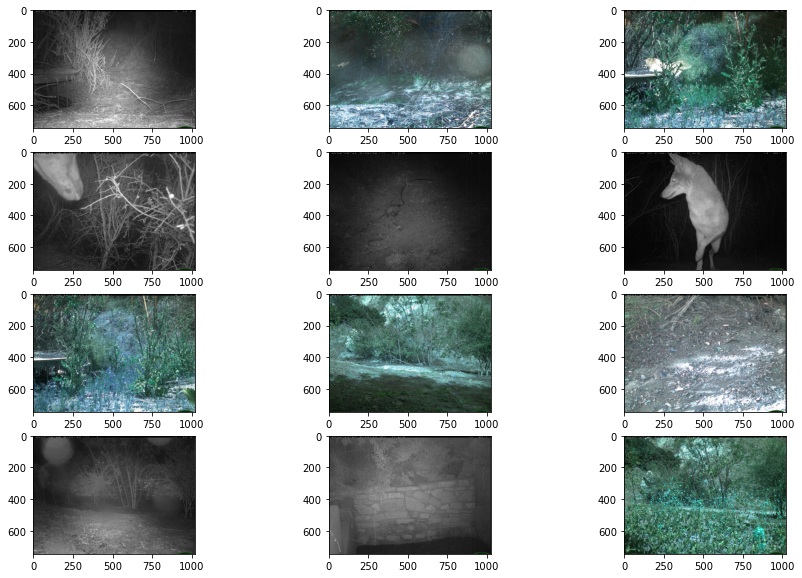

In [17]:
fig = plt.figure(figsize=(15, 10))
columns = 3; rows = 4
for i in range(5002, 5014):
    img=cv2.imread(train_images_dir + '/'+train_images[i])
    fig.add_subplot(rows, columns, i-5001)
    #plt.imshow(img, cmap = plt.cm.bone)
    plt.imshow(img)
    fig.add_subplot

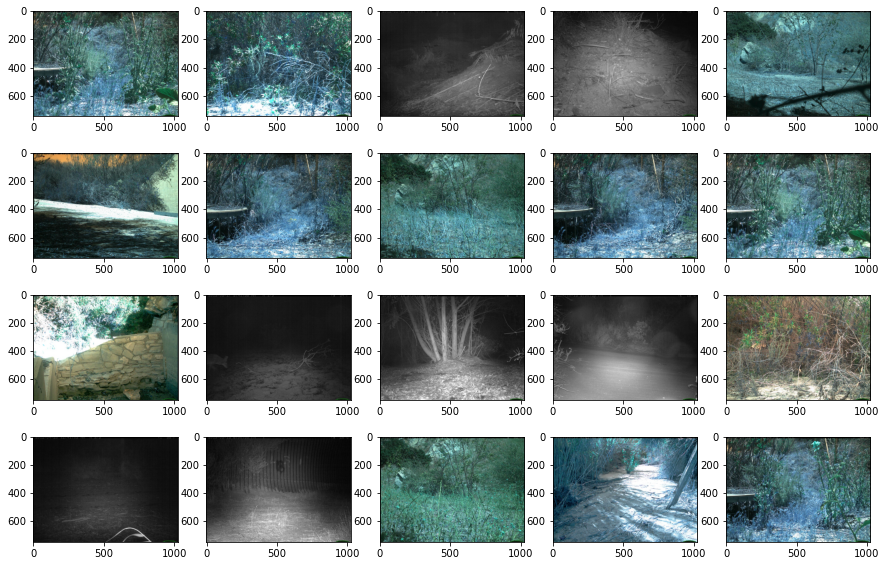

In [7]:
fig = plt.figure(figsize=(15, 10))
columns = 5; rows = 4
for i in range(1, columns*rows + 1):
    img=cv2.imread(train_images_dir + '/'+train_images[i])
    fig.add_subplot(rows, columns, i)
    #plt.imshow(img, cmap = plt.cm.bone)
    plt.imshow(img)
    fig.add_subplot

**<h1 id="ca" style="color:purple;"> Image Preprocessing</h1>**

**Why is preprocessing any different from augmentation?**
Preprocessing is basically a filter - augmentation is basically adding more variations of the same image.

<h2 id="norm">Normalization</h2>

We use normalization to evenly distribute something across an image - we can use normalization to, for example, normalize lighting conditions across the image.

In [19]:
train.head(2)

,category_id,date_captured,file_name,frame_num,id,location,rights_holder,seq_id,seq_num_frames,width,height
0,19,2011-05-13 23:43:18,5998cfa4-23d2-11e8-a6a3-ec086b02610b.jpg,1,5998cfa4-23d2-11e8-a6a3-ec086b02610b,33,Justin Brown,6f084ccc-5567-11e8-bc84-dca9047ef277,3,1024,747
1,19,2012-03-17 03:48:44,588a679f-23d2-11e8-a6a3-ec086b02610b.jpg,2,588a679f-23d2-11e8-a6a3-ec086b02610b,115,Justin Brown,6f12067d-5567-11e8-b3c0-dca9047ef277,3,1024,747


Label of Image shown:  18


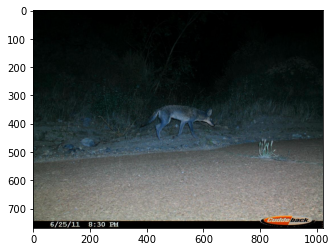

In [25]:
image = cv2.imread(train_images_dir + '/'+train_images[65993])
plt.imshow(image)
print("Label of Image shown: ",train['category_id'][65993] )

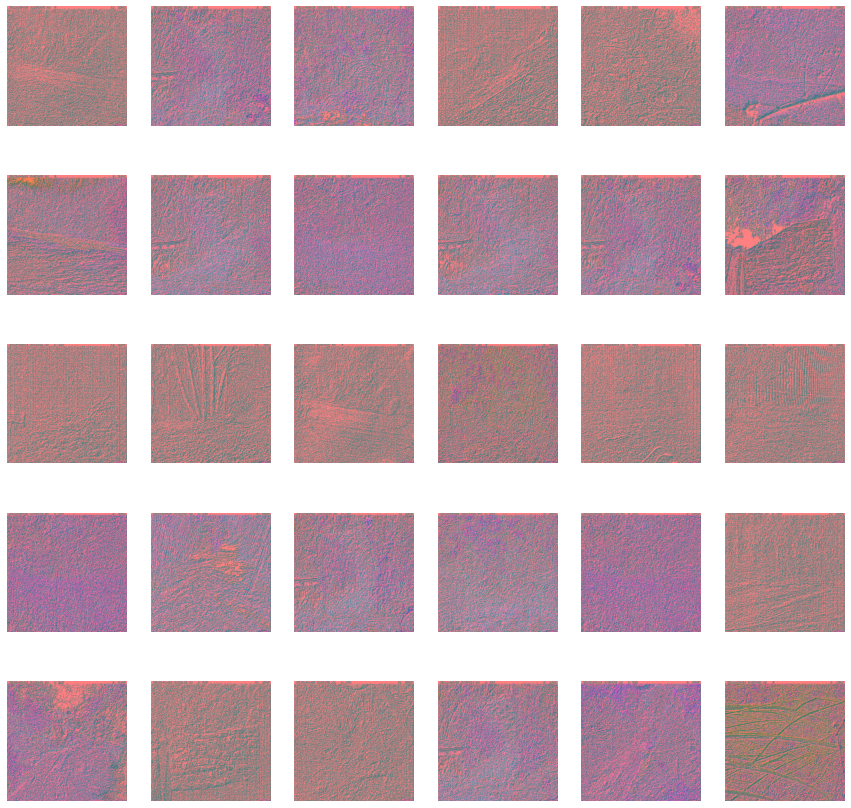

In [46]:
import cv2
def view_images_aug(train_images_dir, train_images, aug = None):
    width = 6
    height = 5
    fig, axs = plt.subplots(height, width, figsize=(15,15))
    for im in range(0, height * width):  
        image = cv2.imread(train_images_dir + '/'+train_images[im])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
        image = cv2.resize(image, (256, 256))
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(256,256))
        image[:, :, 0] = clahe.apply(image[:, :, 0])
        i = im // width
        j = im % width
        axs[i,j].imshow(image, cmap=plt.cm.bone) 
        axs[i,j].axis('off')

view_images_aug(train_images_dir, train_images, aug = None)

**<h1 id="six" style="color:purple;"> Image Augmentations</h1>**

<h2 id="gray">Grayscale images</h2>

We will first try to visualize in grayscale (only gray colors) so that it is possible for us to clearly visualize the varied differences in color, region, and shape.

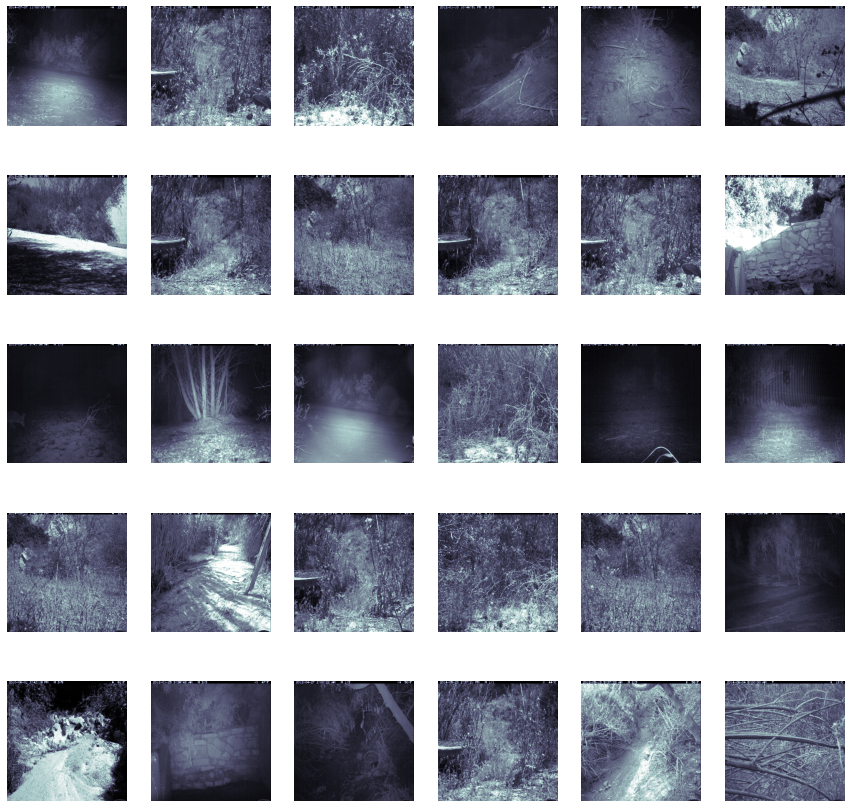

In [48]:
import cv2
def view_images_aug(train_images_dir, train_images, aug = None):
    width = 6
    height = 5
    fig, axs = plt.subplots(height, width, figsize=(15,15))
    for im in range(0, height * width):  
        image = cv2.imread(train_images_dir + '/'+train_images[im])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        image = cv2.resize(image, (256, 256))
        i = im // width
        j = im % width
        axs[i,j].imshow(image, cmap=plt.cm.bone) 
        axs[i,j].axis('off')
        
view_images_aug(train_images_dir, train_images, aug = None)

<h2 id="ben">Ben Graham's method</h2>

The first method we will use is **Ben Graham's method**. It involves utilizing grayscale images as well as a gaussian blur afterwards.

<h3 id="graytrain">Train</h3>

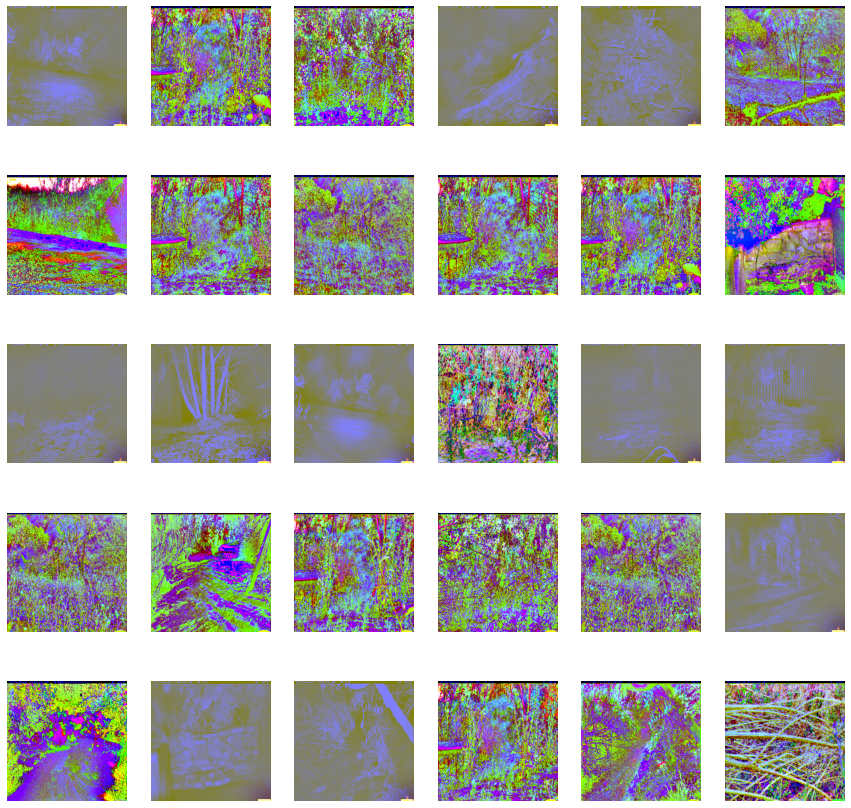

In [49]:
def view_images_aug(train_images_dir, train_images, aug = None):
    width = 6
    height = 5
    fig, axs = plt.subplots(height, width, figsize=(15,15))
    for im in range(0, height * width):  
        image = cv2.imread(train_images_dir + '/'+train_images[im])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
        image = cv2.resize(image, (256, 256))
        image=cv2.addWeighted ( image,4, cv2.GaussianBlur( image , (0,0) , 256/10) ,-4 ,128)
        i = im // width
        j = im % width
        axs[i,j].imshow(image, cmap=plt.cm.bone) 
        axs[i,j].axis('off')
        
view_images_aug(train_images_dir, train_images, aug = None)    

Nice! But we can further observe the clear color distinctions by using Neuron Engineer's method (an improved version of Ben Graham's).

<h2 id="neuron">Neuron Engineer's method</h2>

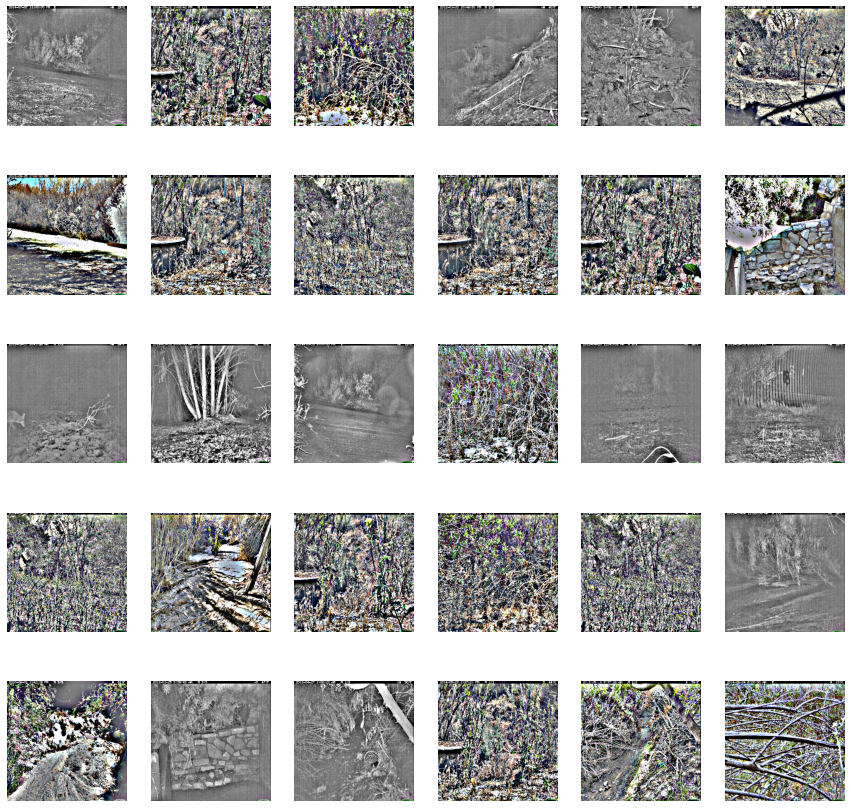

In [50]:
def view_images_aug(train_images_dir, train_images, aug = None):
    width = 6
    height = 5
    fig, axs = plt.subplots(height, width, figsize=(15,15))
    for im in range(0, height * width):  
        image = cv2.imread(train_images_dir + '/'+train_images[im])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (256, 256))
        image=cv2.addWeighted ( image,4, cv2.GaussianBlur( image , (0,0) , 10) ,-4 ,128)
        i = im // width
        j = im % width
        axs[i,j].imshow(image, cmap=plt.cm.bone) 
        axs[i,j].axis('off')
        
view_images_aug(train_images_dir, train_images, aug = None)    

Here we can finally visualize the clear distinctions in our data. The clear regions, the clear color differences, the clear everything! This is probably the best preprocessing method that we can apply... maybe not?

<h2 id="circ">Circle crop</h2>

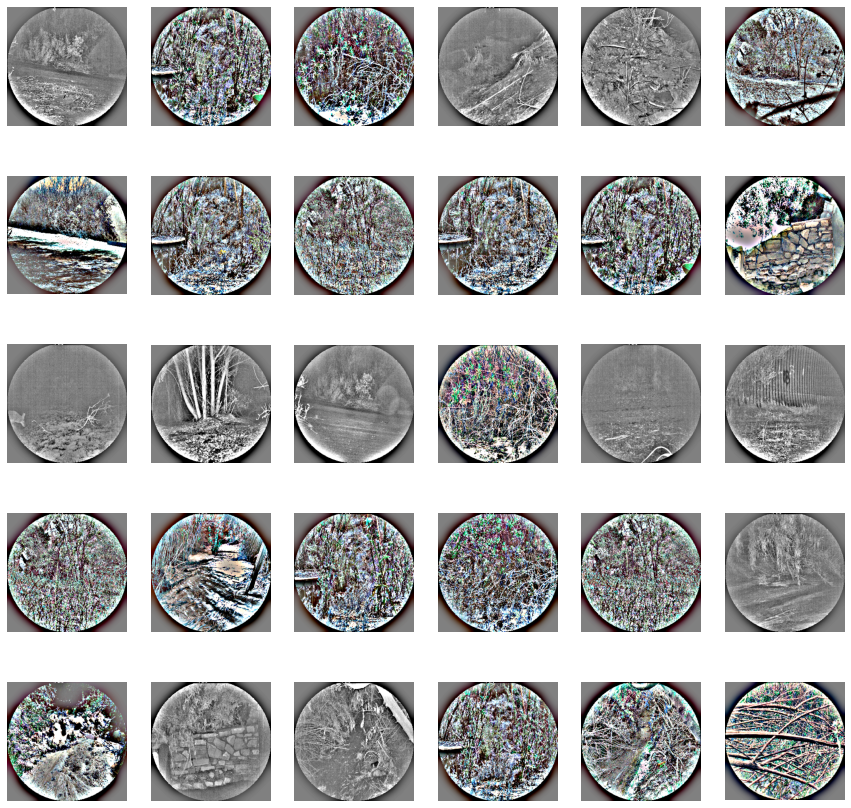

In [51]:
def crop_image_from_gray(img,tol=7):
    if img.ndim ==2:
        mask = img>tol
        return img[np.ix_(mask.any(1),mask.any(0))]
    elif img.ndim==3:
        gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        mask = gray_img>tol
        
        check_shape = img[:,:,0][np.ix_(mask.any(1),mask.any(0))].shape[0]
        if (check_shape == 0): # image is too dark so that we crop out everything,
            return img # return original image
        else:
            img1=img[:,:,0][np.ix_(mask.any(1),mask.any(0))]
            img2=img[:,:,1][np.ix_(mask.any(1),mask.any(0))]
            img3=img[:,:,2][np.ix_(mask.any(1),mask.any(0))]
            img = np.stack([img1,img2,img3],axis=-1)
        return img
    
def circle_crop(img, sigmaX=10):   
    """
    Create circular crop around image centre    
    """    
    
    img = crop_image_from_gray(img)    
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    height, width, depth = img.shape    
    
    x = int(width/2)
    y = int(height/2)
    r = np.amin((x,y))
    
    circle_img = np.zeros((height, width), np.uint8)
    cv2.circle(circle_img, (x,y), int(r), 1, thickness=-1)
    img = cv2.bitwise_and(img, img, mask=circle_img)
    img = crop_image_from_gray(img)
    img=cv2.addWeighted ( img,4, cv2.GaussianBlur( img , (0,0) , sigmaX) ,-4 ,128)
    return img 

def view_images_aug(train_images_dir, train_images, aug = None):
    width = 6
    height = 5
    fig, axs = plt.subplots(height, width, figsize=(15,15))
    for im in range(0, height * width):  
        image = cv2.imread(train_images_dir + '/'+train_images[im])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (256, 256))
        image= circle_crop(image)
        i = im // width
        j = im % width
        axs[i,j].imshow(image, cmap=plt.cm.bone) 
        axs[i,j].axis('off')
        
view_images_aug(train_images_dir, train_images, aug = None)

<h2 id="autocrop">Auto cropping</h2>

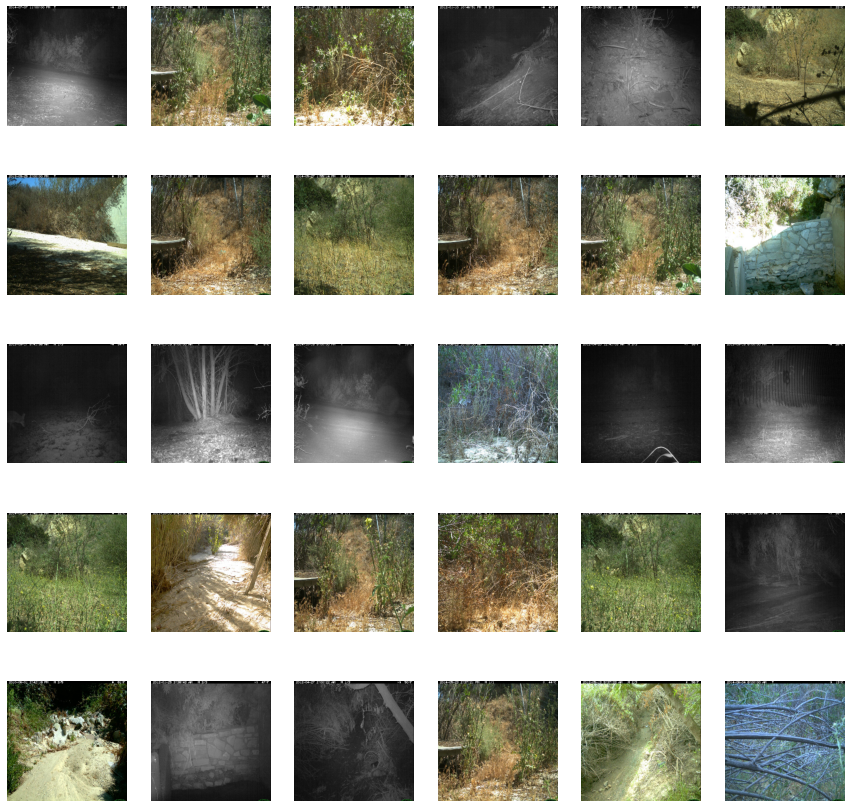

In [52]:
def crop_image1(img,tol=7):
    # img is image data
    # tol  is tolerance
        
    mask = img>tol
    return img[np.ix_(mask.any(1),mask.any(0))]

def crop_image_from_gray(img,tol=7):
    if img.ndim ==2:
        mask = img>tol
        return img[np.ix_(mask.any(1),mask.any(0))]
    elif img.ndim==3:
        gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        mask = gray_img>tol
        
        check_shape = img[:,:,0][np.ix_(mask.any(1),mask.any(0))].shape[0]
        if (check_shape == 0): # image is too dark so that we crop out everything,
            return img # return original image
        else:
            img1=img[:,:,0][np.ix_(mask.any(1),mask.any(0))]
            img2=img[:,:,1][np.ix_(mask.any(1),mask.any(0))]
            img3=img[:,:,2][np.ix_(mask.any(1),mask.any(0))]
    #         print(img1.shape,img2.shape,img3.shape)
            img = np.stack([img1,img2,img3],axis=-1)
    #         print(img.shape)
        return img
    
def view_images_aug(train_images_dir, train_images, aug = None):
    width = 6
    height = 5
    fig, axs = plt.subplots(height, width, figsize=(15,15))
    for im in range(0, height * width):  
        image = cv2.imread(train_images_dir + '/'+train_images[im])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (256, 256))
        image= crop_image_from_gray(image)
        i = im // width
        j = im % width
        axs[i,j].imshow(image, cmap=plt.cm.bone) 
        axs[i,j].axis('off')
view_images_aug(train_images_dir, train_images, aug = None)        

<h2 id="bgsub">Background subtraction</h2>

Another thing you can do is **background subtraction.**

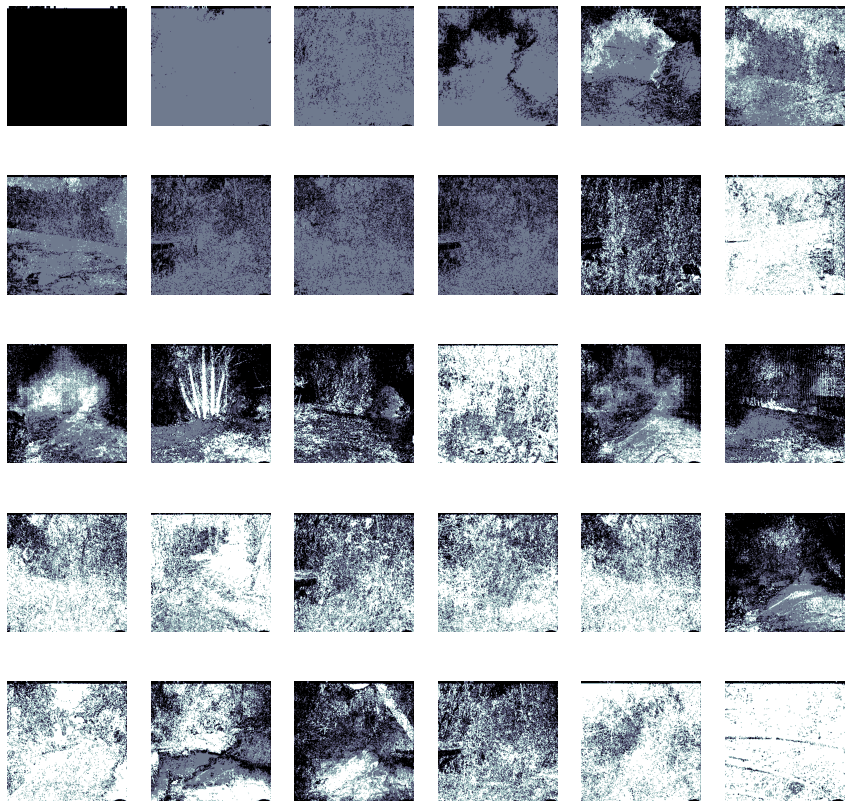

In [53]:
fgbg = cv.createBackgroundSubtractorMOG2()
    
def view_images_aug(train_images_dir, train_images, aug = None):
    width = 6
    height = 5
    fig, axs = plt.subplots(height, width, figsize=(15,15))
    for im in range(0, height * width):  
        image = cv2.imread(train_images_dir + '/'+train_images[im])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (256, 256))
        image= fgbg.apply(image)
        i = im // width
        j = im % width
        axs[i,j].imshow(image, cmap=plt.cm.bone) 
        axs[i,j].axis('off')
view_images_aug(train_images_dir, train_images, aug = None)        

<h2 id="seg">Image segmentation</h2>

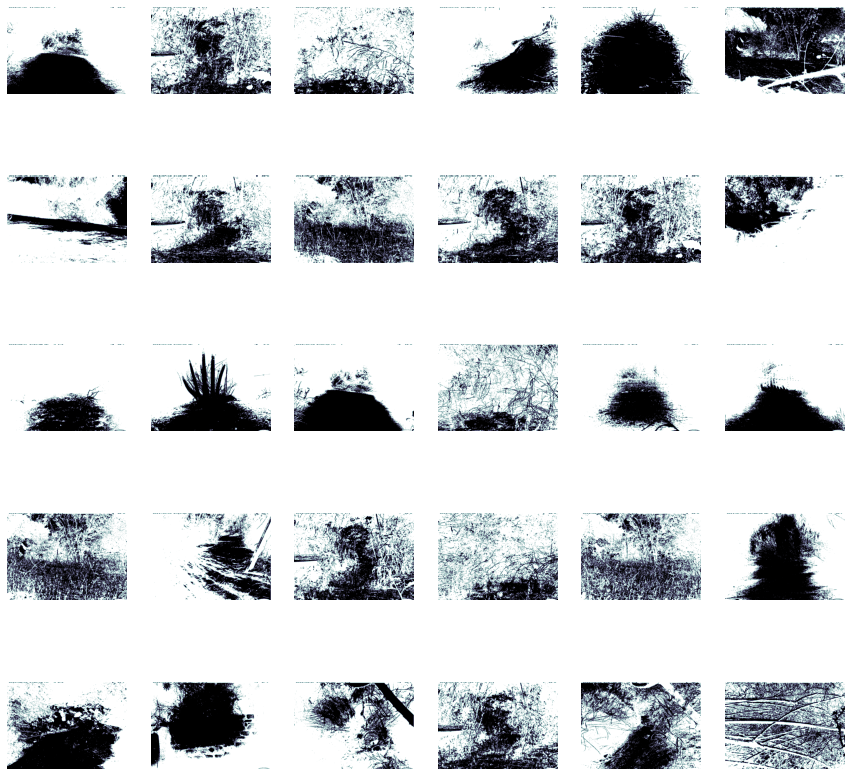

In [54]:
fgbg = cv.createBackgroundSubtractorMOG2()
    
def view_images_aug(train_images_dir, train_images, aug = None):
    width = 6
    height = 5
    fig, axs = plt.subplots(height, width, figsize=(15,15))
    for im in range(0, height * width):  
        image = cv2.imread(train_images_dir + '/'+train_images[im])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        ret, thresh = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
        i = im // width
        j = im % width
        axs[i,j].imshow(thresh, cmap=plt.cm.bone) 
        axs[i,j].axis('off')
view_images_aug(train_images_dir, train_images, aug = None)

This is called **image segmentation**. It breaks down an image into its constituent parts represented by the distinction between regions (i.e in this instance the growth is white and the halo/surrrounding area is blackened). It helps our model to visually understand the distinctions even better than using grayscale images .

However, it has a heavy downside as we lose all information inside and outside the growth and thus our model loses the capability to understand or learn something from the image.

<h2 id="segf">A finer method for image segmentation</h2>

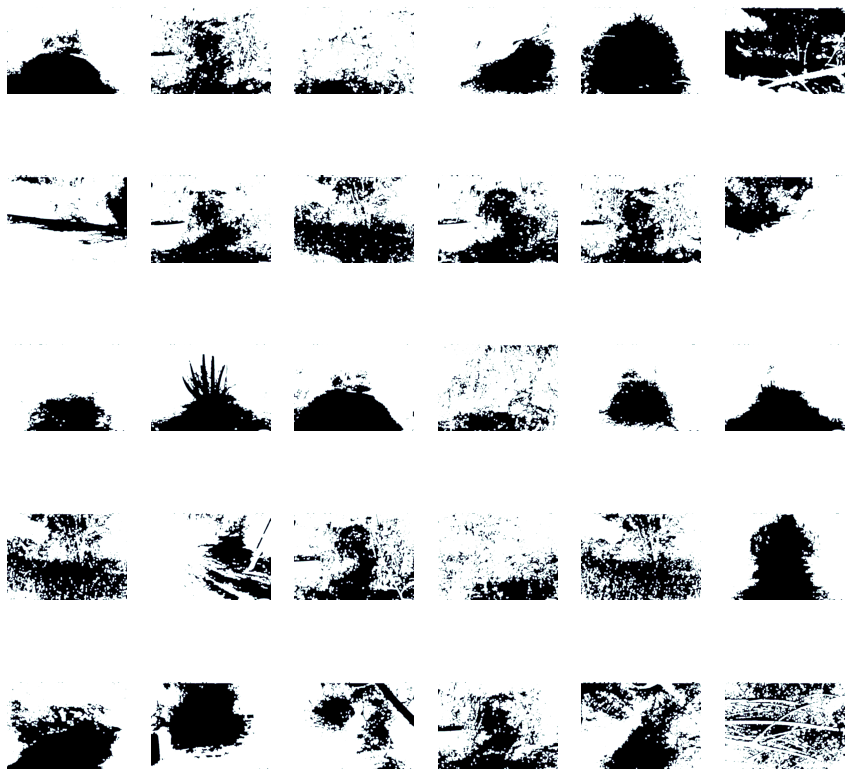

In [55]:
def view_images_aug(train_images_dir, train_images, aug = None):
    width = 6
    height = 5
    fig, axs = plt.subplots(height, width, figsize=(15,15))
    for im in range(0, height * width):  
        image = cv2.imread(train_images_dir + '/'+train_images[im])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        ret, thresh = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
        kernel = np.ones((3, 3), np.uint8)
        opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)

        # sure background area
        sure_bg = cv2.dilate(opening, kernel, iterations=3)

        # Finding sure foreground area
        dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
        ret, sure_fg = cv2.threshold(dist_transform, 0.7 * dist_transform.max(), 255, 0)

        # Finding unknown region
        sure_fg = np.uint8(sure_fg)
        unknown = cv2.subtract(sure_bg, sure_fg)
        i = im // width
        j = im % width
        axs[i,j].imshow(sure_bg, cmap=plt.cm.bone) 
        axs[i,j].axis('off')
view_images_aug(train_images_dir, train_images, aug = None)        

This is a finer form of image segmentation where we use a second threshold to finetune our segmented data in a sort of way. This helps us see some parts of the growth and also it lets us see the images and the halos in small amounts.

<h2 id="segfg">Grayscale image segmentation</h2>

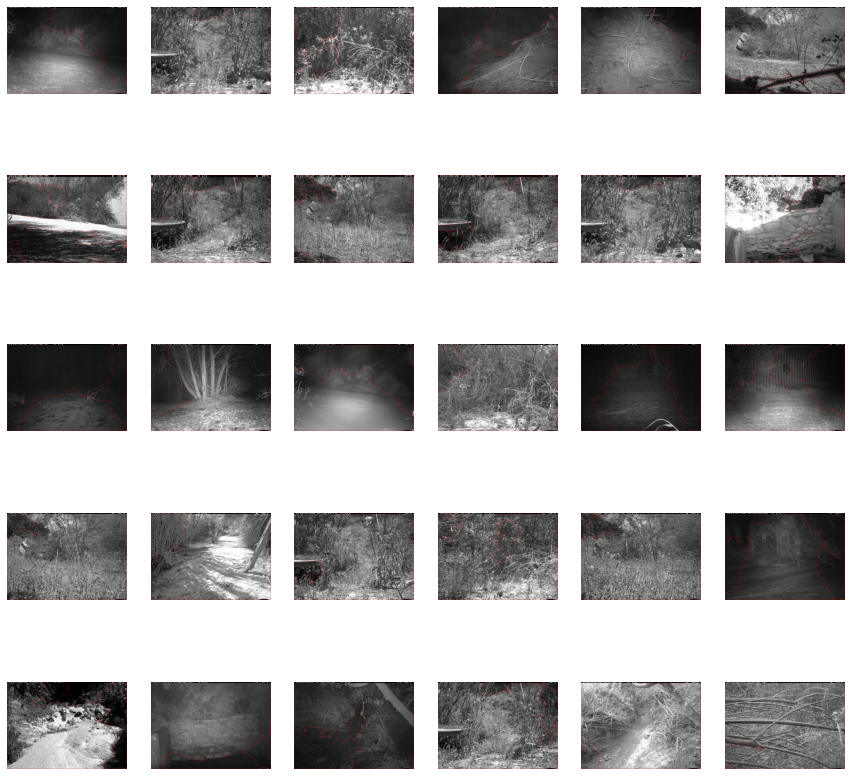

In [56]:
def view_images_aug(train_images_dir,train_images, aug = None):
    width = 6
    height = 5
    fig, axs = plt.subplots(height, width, figsize=(15,15))
    for im in range(0, height * width):  
        image = cv2.imread(train_images_dir + '/'+train_images[im])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        ret, thresh = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
        kernel = np.ones((3, 3), np.uint8)
        opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)

        # sure background area
        sure_bg = cv2.dilate(opening, kernel, iterations=3)

        # Finding sure foreground area
        dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
        ret, sure_fg = cv2.threshold(dist_transform, 0.7 * dist_transform.max(), 255, 0)

        # Finding unknown region
        sure_fg = np.uint8(sure_fg)
        unknown = cv2.subtract(sure_bg, sure_fg)
        ret, markers = cv2.connectedComponents(sure_fg)

        # Add one to all labels so that sure background is not 0, but 1
        markers = markers + 1

        # Now, mark the region of unknown with zero
        markers[unknown == 255] = 0
        image = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)

        markers = cv2.watershed(image, markers)
        image[markers == -1] = [255, 0, 0]
        i = im // width
        j = im % width
        axs[i,j].imshow(image, cmap=plt.cm.bone) 
        axs[i,j].axis('off')
view_images_aug(train_images_dir,train_images, aug = None)

These are now the segmented grayscale images, complete with markers. It will be a bit difficult for the model to learn anything from this due to the complete and utter confusion in the image with regard to the clear distinctions between image segments and there is no disctinction between parts of the image.

<h2 id="fourier">Fourier method for pixel distributions</h2>

Now we move on to something more interesting: **Fourier transforms.** 

In [ ]:
def view_images_aug(train_images_dir, train_images, aug = None):
    width = 6
    height = 5
    fig, axs = plt.subplots(height, width, figsize=(15,15))
    for im in range(0, height * width):  
        image = cv2.imread(train_images_dir + '/'+train_images[im])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        f = np.fft.fft2(image)
        fshift = np.fft.fftshift(f)
        magnitude_spectrum = 20*np.log(np.abs(fshift))

        i = im // width
        j = im % width
        axs[i,j].imshow(magnitude_spectrum, cmap=plt.cm.bone) 
        axs[i,j].axis('off')
view_images_aug(train_images_dir, train_images, aug = None)

What comes out is the magnitude spectrum of the image. It is helpful to understand where the majority of the growth is concentrated.

<h2 id="albumentation">Albumentations library demonstration</h2>

Also, you can use the albumentations library to create a lot of simulated images for your model. Remember, your model **MUST BE ABLE TO GENERALIZE!**

In [ ]:
import albumentations as A
chosen_image = cv2.imread(train_images_dir + '/'+train_images[339])
albumentation_list = [A.RandomSunFlare(p=1), A.RandomFog(p=1), A.RandomBrightness(p=1),
                      A.RandomCrop(p=1,height = 512, width = 512), A.Rotate(p=1, limit=90),
                      A.RGBShift(p=1), A.RandomSnow(p=1),
                      A.HorizontalFlip(p=1), A.VerticalFlip(p=1), A.RandomContrast(limit = 0.5,p = 1),
                      A.HueSaturationValue(p=1,hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=50)]

img_matrix_list = []
bboxes_list = []
for aug_type in albumentation_list:
    img = aug_type(image = chosen_image)['image']
    img_matrix_list.append(img)

img_matrix_list.insert(0,chosen_image)    

titles_list = ["Original","RandomSunFlare","RandomFog","RandomBrightness",
               "RandomCrop","Rotate", "RGBShift", "RandomSnow","HorizontalFlip", "VerticalFlip", "RandomContrast","HSV"]

##reminder of helper function
def plot_multiple_img(img_matrix_list, title_list, ncols, main_title=""):
    fig, myaxes = plt.subplots(figsize=(20, 15), nrows=3, ncols=ncols, squeeze=False)
    fig.suptitle(main_title, fontsize = 30)
    fig.subplots_adjust(wspace=0.3)
    fig.subplots_adjust(hspace=0.3)
    for i, (img, title) in enumerate(zip(img_matrix_list, title_list)):
        myaxes[i // ncols][i % ncols].imshow(img)
        myaxes[i // ncols][i % ncols].set_title(title, fontsize=15)
    plt.show()
    
plot_multiple_img(img_matrix_list, titles_list, ncols = 4,main_title="Different Types of Augmentations")


We have much more augmentations we can try like:

In [ ]:
chosen_image = cv2.imread(train_images_dir + '/'+train_images[5585])
albumentation_list = [A.RandomSunFlare(p=1), A.GaussNoise(p=1), A.CLAHE(p=1),
                      A.RandomRain(p=1), A.Rotate(p=1, limit=90),
                      A.RGBShift(p=1), A.RandomSnow(p=1),
                      A.HorizontalFlip(p=1), A.VerticalFlip(p=1), A.RandomContrast(limit = 0.5,p = 1),
                      A.HueSaturationValue(p=1,hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=50)]

img_matrix_list = []
bboxes_list = []
for aug_type in albumentation_list:
    img = aug_type(image = chosen_image)['image']
    img_matrix_list.append(img)

img_matrix_list.insert(0,chosen_image)    

titles_list = ["Original","RandomSunFlare","GaussNoise","CLAHE",
               "RandomRain","Rotate", "RGBShift", "RandomSnow","HorizontalFlip", "VerticalFlip", "RandomContrast","HSV"]

##reminder of helper function
def plot_multiple_img(img_matrix_list, title_list, ncols, main_title=""):
    fig, myaxes = plt.subplots(figsize=(20, 15), nrows=3, ncols=ncols, squeeze=False)
    fig.suptitle(main_title, fontsize = 30)
    fig.subplots_adjust(wspace=0.3)
    fig.subplots_adjust(hspace=0.3)
    for i, (img, title) in enumerate(zip(img_matrix_list, title_list)):
        myaxes[i // ncols][i % ncols].imshow(img)
        myaxes[i // ncols][i % ncols].set_title(title, fontsize=15)
    plt.show()
    
plot_multiple_img(img_matrix_list, titles_list, ncols = 4,main_title="Different Types of Augmentations")


In [ ]:
chosen_image = cv2.imread(train_images_dir + '/'+train_images[65993])
albumentation_list = [A.RandomSunFlare(p=0.8), A.GaussNoise(p=0.8), A.CLAHE(p=0.9),
                      A.RandomRain(p=1), A.Rotate(p=1, limit=90),
                      A.RGBShift(p=1), A.RandomSnow(p=1),
                      A.HorizontalFlip(p=1), A.VerticalFlip(p=0.8), A.RandomContrast(limit = 0.5,p = 1),
                      A.HueSaturationValue(p=1,hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=50)]

img_matrix_list = []
bboxes_list = []
for aug_type in albumentation_list:
    img = aug_type(image = chosen_image)['image']
    img_matrix_list.append(img)

img_matrix_list.insert(0,chosen_image)    

titles_list = ["Original","RandomSunFlare","GaussNoise","CLAHE",
               "RandomRain","Rotate", "RGBShift", "RandomSnow","HorizontalFlip", "VerticalFlip", "RandomContrast","HSV"]

##reminder of helper function
def plot_multiple_img(img_matrix_list, title_list, ncols, main_title=""):
    fig, myaxes = plt.subplots(figsize=(20, 15), nrows=3, ncols=ncols, squeeze=False)
    fig.suptitle(main_title, fontsize = 30)
    fig.subplots_adjust(wspace=0.3)
    fig.subplots_adjust(hspace=0.3)
    for i, (img, title) in enumerate(zip(img_matrix_list, title_list)):
        myaxes[i // ncols][i % ncols].imshow(img)
        myaxes[i // ncols][i % ncols].set_title(title, fontsize=15)
    plt.show()
    
plot_multiple_img(img_matrix_list, titles_list, ncols = 4,main_title="Different Types of Augmentations")


<h2 id="erosion">Erosion</h2>

In [26]:
def view_images_aug(train_images_dir, train_images, aug = None):
    width = 6
    height = 5
    fig, axs = plt.subplots(height, width, figsize=(15,15))
    for im in range(0, height * width):  
        image = cv2.imread(train_images_dir + '/'+train_images[im])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (256, 256))
        kernel = np.ones((5,5), np.uint8) 
  
        # The first parameter is the original image, 
        # kernel is the matrix with which image is  
        # convolved and third parameter is the number  
        # of iterations, which will determine how much  
        # you want to erode/dilate a given image.  
        img_erosion = cv2.erode(image, kernel, iterations=1) 
        i = im // width
        j = im % width
        axs[i,j].imshow(image, cmap=plt.cm.bone) 
        axs[i,j].axis('off')
        

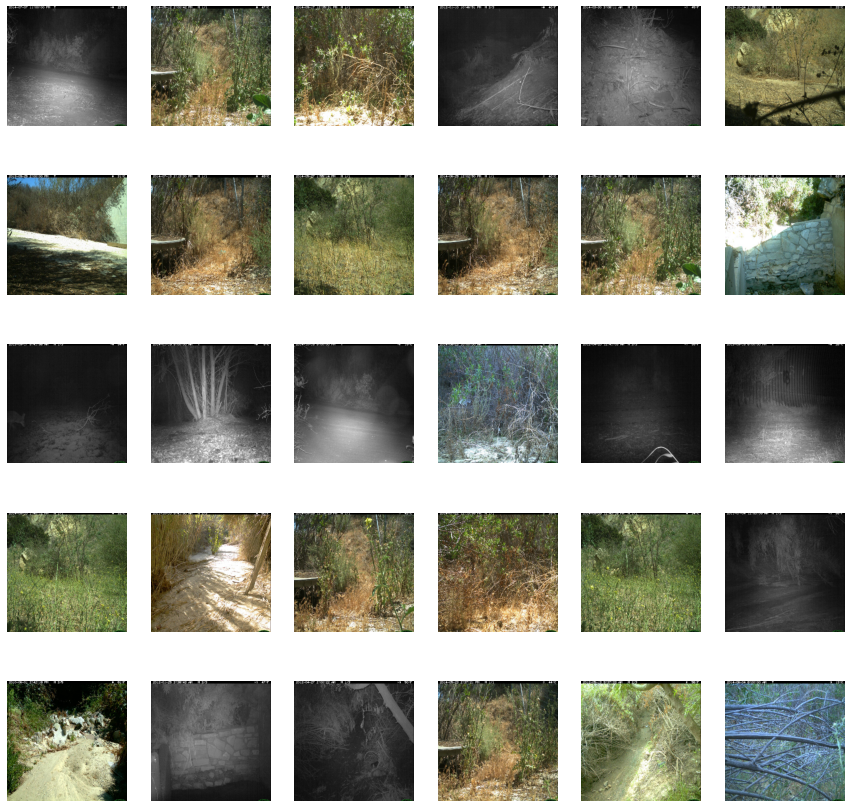

In [27]:
view_images_aug(train_images_dir, train_images, aug = None)

<h2 id="dilation">Dilation</h2>


In [28]:
def view_images_aug(train_images_dir, train_images, aug = None):
    width = 6
    height = 5
    fig, axs = plt.subplots(height, width, figsize=(15,15))
    for im in range(0, height * width):  
        image = cv2.imread(train_images_dir + '/'+train_images[im])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (256, 256))
        kernel = np.ones((5,5), np.uint8) 
    
        img_erosion = cv2.dilate(image, kernel, iterations=1) 
        i = im // width
        j = im % width
        axs[i,j].imshow(image, cmap=plt.cm.bone) 
        axs[i,j].axis('off')
        

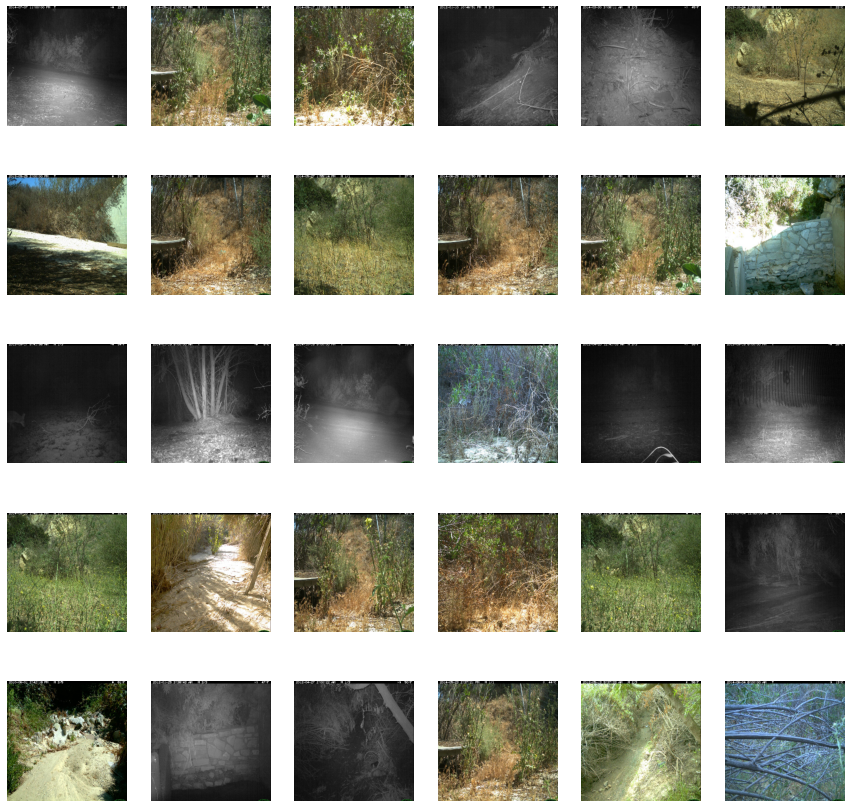

In [29]:
view_images_aug(train_images_dir, train_images, aug = None)

Now for both!

<h2 id="combo">Combination of erosion and dilation</h2>

In [30]:
def view_images_aug(train_images_dir, train_images, aug = None):
    width = 6
    height = 5
    fig, axs = plt.subplots(height, width, figsize=(15,15))
    for im in range(0, height * width):  
        image = cv2.imread(train_images_dir + '/'+train_images[im])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (256, 256))
        kernel = np.ones((5,5), np.uint8) 
  
        img_erosion = cv2.erode(image, kernel, iterations=1) 
        img_erosion = cv2.dilate(image, kernel, iterations=1) 
        i = im // width
        j = im % width
        axs[i,j].imshow(image, cmap=plt.cm.bone) 
        axs[i,j].axis('off')

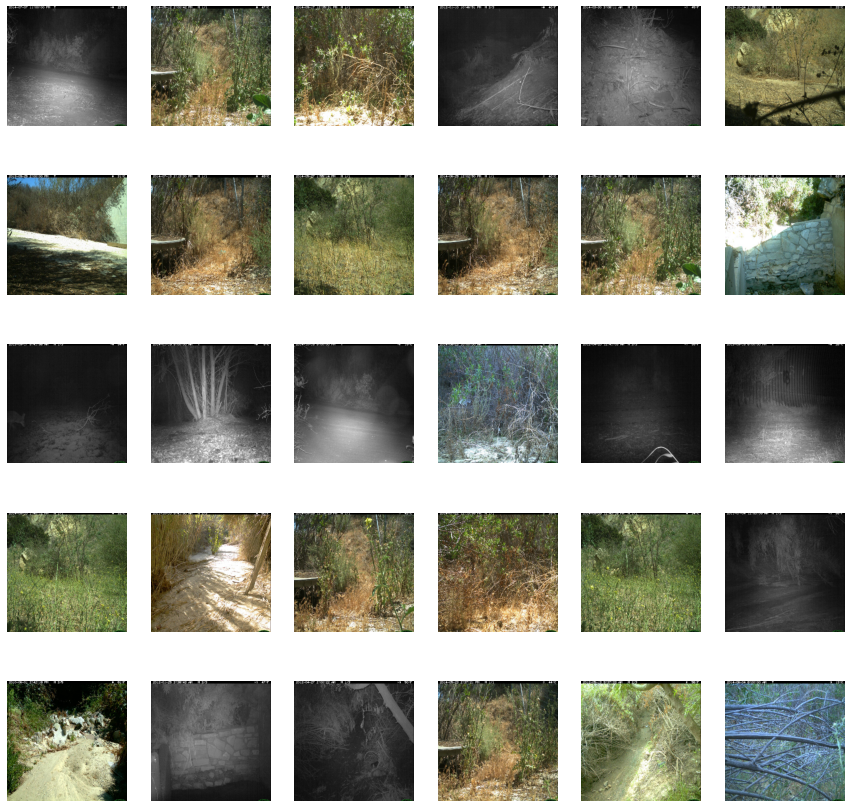

In [31]:
view_images_aug(train_images_dir, train_images, aug = None)